In [1]:
import sys

sys.path.append("..")

from utilities import *

warnings.filterwarnings("ignore")

raw_data = pd.read_excel("../data/Datos_Market_copy.xlsx")

sa = SalesAnalysis(raw_data)

data = sa.data

data['date'] = pd.to_datetime(data['date'])

data = data[
    data["brand"].isin(["brand-35", "brand-14", "brand-15"])
] # Filtramos las 3 brands principales únicamente

/Users/oscarjimenezbou/Documents/TFG_ADE/code_new_models/TFG/lib/python3.9/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


In [2]:
model, selected_var, deleted_var = sa.regression_with_backward_elimination(data, verbose=True)
# print(model.summary())
x_train_exog = sa.x_train_exog_custom(data, selected_var, model)
for regressor in x_train_exog.columns:
    print(f"\nregressor: {regressor}")

Fórmula del modelo:
volume_sales ~ price + C(supermarket) + C(variant) + C(pack_size) + C(brand) + (price + C(brand)) ** 2
Iteración 1: Eliminando 'price:C(brand)[T.brand-15]' (p-valor = 0.9778)
Iteración 2: Eliminando 'price' (p-valor = 0.0895)
Iteración 3: Todas las variables restantes son significativas (p-valor ≤ 0.05)

Resumen:
  Variables iniciales: 15
  Variables seleccionadas: 13
  Variables eliminadas: 2
  R² ajustado: 0.4307
✅ YES - All features match perfectly!

regressor: C(supermarket)[T.supermarket-B]

regressor: C(supermarket)[T.supermarket-C]

regressor: C(supermarket)[T.supermarket-D]

regressor: C(variant)[T.light]

regressor: C(variant)[T.standard]

regressor: C(variant)[T.vegan]

regressor: C(pack_size)[T.351 - 500 GR]

regressor: C(pack_size)[T.501 - 700 GR]

regressor: C(pack_size)[T.701 - 1000 GR]

regressor: C(brand)[T.brand-15]

regressor: C(brand)[T.brand-35]

regressor: price:C(brand)[T.brand-35]


In [3]:
# ============================================================================
# PASO 1: Preparación de datos y creación de series_id
# ============================================================================


# Convertir date a datetime si no lo está

# Crear series_id combinando brand + supermarket + variant + pack_size
data['series_id'] = (
    data['brand'].astype(str) + '_' + 
    data['supermarket'].astype(str) + '_' + 
    data['variant'].astype(str) + '_' + 
    data['pack.size'].astype(str)
)

# Ordenar por series_id y date
data = data.sort_values(['series_id', 'date']).reset_index(drop=True)

print(f"Número de series únicas: {data['series_id'].nunique()}")
print(f"Series ID ejemplo: {data['series_id'].iloc[0]}")
print(f"Rango de fechas: {data['date'].min()} a {data['date'].max()}")


Número de series únicas: 113
Series ID ejemplo: brand-14_supermarket-A_flavoured_0 - 350 GR
Rango de fechas: 2021-01-31 00:00:00 a 2023-12-31 00:00:00


In [4]:
#FIXME: revisar si podemos precescindir de esta celda
# ============================================================================
# PASO 2: Preparación de regresores exógenos para Prophet
# ============================================================================

# Prophet requiere regresores numéricos. Necesitamos agregar las variables
# seleccionadas por backward elimination al DataFrame principal ANTES del split.

# Preparar datos con las variables renombradas para patsy
data_for_regressors = data.copy()
rename_dict = {
    "value.sales": "value_sales",
    "unit.sales": "unit_sales",
    "volume.sales": "volume_sales",
    "pack.size": "pack_size",
}
rename_dict = {k: v for k, v in rename_dict.items() if k in data_for_regressors.columns}
data_for_regressors.rename(columns=rename_dict, inplace=True)

# Crear la matriz de diseño usando la misma fórmula que backward elimination
formula = (
    "volume_sales ~ price + C(supermarket) + C(variant) + C(pack_size) + "
    "C(brand) + (price + C(brand)) ** 2"
)

y_design, X_design = patsy.dmatrices(
    formula, data=data_for_regressors, return_type="dataframe"
)

# Filtrar solo las columnas seleccionadas (excluyendo Intercept)
selected_cols_no_intercept = [
    col for col in selected_var if col != "Intercept" and col != "const"
]

# Verificar que las columnas existen
missing_cols = [col for col in selected_cols_no_intercept if col not in X_design.columns]
if missing_cols:
    print(f"⚠️ Advertencia: Las siguientes columnas no se encontraron: {missing_cols}")
    selected_cols_no_intercept = [
        col for col in selected_cols_no_intercept if col in X_design.columns
    ]

# Agregar las variables exógenas al DataFrame principal
for col in selected_cols_no_intercept:
    if col in X_design.columns:
        data[col] = X_design[col].values

print(f"\nRegresores preparados y agregados al DataFrame: {len(selected_cols_no_intercept)}")
print(f"Regresores: {selected_cols_no_intercept[:10]}...")  # Mostrar primeros 10



Regresores preparados y agregados al DataFrame: 12
Regresores: ['C(supermarket)[T.supermarket-B]', 'C(supermarket)[T.supermarket-C]', 'C(supermarket)[T.supermarket-D]', 'C(variant)[T.light]', 'C(variant)[T.standard]', 'C(variant)[T.vegan]', 'C(pack_size)[T.351 - 500 GR]', 'C(pack_size)[T.501 - 700 GR]', 'C(pack_size)[T.701 - 1000 GR]', 'C(brand)[T.brand-15]']...


In [5]:
# ============================================================================
# PASO 3: Split temporal
# ============================================================================

# Fijar fechas explícitamente (igual que CatBoost)
train_cutoff = pd.Timestamp('2023-06-30')
test_start = pd.Timestamp('2023-07-01')
test_end = pd.Timestamp('2023-12-31')

train_data = data[data['date'] <= train_cutoff].copy()
test_data = data[(data['date'] >= test_start) & (data['date'] <= test_end)].copy()

print(f"Train: {len(train_data)} filas, desde {train_data['date'].min()} hasta {train_data['date'].max()}")
print(f"Test: {len(test_data)} filas, desde {test_data['date'].min()} hasta {test_data['date'].max()}")
print(f"Número de series en train: {train_data['series_id'].nunique()}")
print(f"Número de series en test: {test_data['series_id'].nunique()}")


Train: 2814 filas, desde 2021-01-31 00:00:00 hasta 2023-06-30 00:00:00
Test: 589 filas, desde 2023-07-31 00:00:00 hasta 2023-12-31 00:00:00
Número de series en train: 113
Número de series en test: 107


In [6]:
# ============================================================================
# PASO 4: Función para entrenar modelo Prophet por serie
# ============================================================================

def train_prophet_for_series(series_data_train, regressor_cols, seasonality_mode='multiplicative'):
    """
    Entrena un modelo Prophet para una serie temporal específica.
    
    Parameters:
    -----------
    series_data_train : pd.DataFrame
        Datos de entrenamiento para una serie (debe tener 'date', 'volume.sales' y regresores)
    regressor_cols : list
        Lista de nombres de columnas de regresores a incluir
    seasonality_mode : str
        'multiplicative' o 'additive'
    
    Returns:
    --------
    Prophet model entrenado
    """
    # Preparar datos en formato Prophet
    prophet_data = pd.DataFrame({
        'ds': pd.to_datetime(series_data_train['date']),
        'y': series_data_train['volume.sales'].values
    })
    
    # Agregar regresores
    for col in regressor_cols:
        if col in series_data_train.columns:
            prophet_data[col] = series_data_train[col].values
    
    # Crear y configurar modelo Prophet
    model = Prophet(
        yearly_seasonality=True,  # Estacionalidad anual para datos mensuales
        weekly_seasonality=False,  # No hay estacionalidad semanal en datos mensuales
        daily_seasonality=False,
        seasonality_mode=seasonality_mode,
        interval_width=0.95,  # Intervalos de confianza al 95%
        changepoint_prior_scale=0.05  # Control de flexibilidad de tendencia
    )
    
    # Agregar regresores
    for col in regressor_cols:
        if col in prophet_data.columns:
            model.add_regressor(col)
    
    # Entrenar modelo
    model.fit(prophet_data)
    
    return model

print("Función train_prophet_for_series definida")


Función train_prophet_for_series definida


In [7]:
# ============================================================================
# PASO 5: Entrenar modelos Prophet para todas las series
# ============================================================================

# Obtener lista de regresores (sin intercept) - usar las columnas que agregamos al DataFrame
regressor_cols = [col for col in selected_cols_no_intercept if col in train_data.columns]

print(f"Entrenando modelos Prophet para {train_data['series_id'].nunique()} series...")
print(f"Usando {len(regressor_cols)} regresores")

# Diccionario para almacenar modelos entrenados
prophet_models = {}

# Contador para mostrar progreso
n_series = train_data['series_id'].nunique()
processed = 0

# Entrenar modelo para cada serie
for series_id in train_data['series_id'].unique():
    series_train = train_data[train_data['series_id'] == series_id].copy()
    
    # Verificar que hay suficientes datos (mínimo 12 meses para estacionalidad anual)
    if len(series_train) < 12:
        print(f"⚠️ Serie {series_id} tiene solo {len(series_train)} observaciones, se omite")
        continue
    
    try:
        # Entrenar modelo (probar multiplicative primero)
        model = train_prophet_for_series(series_train, regressor_cols, seasonality_mode='multiplicative')
        prophet_models[series_id] = model
        processed += 1
        
        if processed % 20 == 0:
            print(f"Procesadas {processed}/{n_series} series...")
    except Exception as e:
        print(f"⚠️ Error entrenando serie {series_id}: {str(e)}")
        continue

print(f"\n✅ Modelos entrenados exitosamente: {len(prophet_models)}/{n_series}")


Entrenando modelos Prophet para 113 series...
Usando 12 regresores


18:12:43 - cmdstanpy - INFO - Chain [1] start processing
18:12:43 - cmdstanpy - INFO - Chain [1] done processing
18:12:43 - cmdstanpy - INFO - Chain [1] start processing
18:12:43 - cmdstanpy - INFO - Chain [1] done processing
18:12:43 - cmdstanpy - INFO - Chain [1] start processing
18:12:43 - cmdstanpy - INFO - Chain [1] done processing
18:12:43 - cmdstanpy - INFO - Chain [1] start processing


⚠️ Serie brand-14_supermarket-A_light_351 - 500 GR tiene solo 10 observaciones, se omite


18:12:43 - cmdstanpy - INFO - Chain [1] done processing
18:12:44 - cmdstanpy - INFO - Chain [1] start processing
18:12:44 - cmdstanpy - INFO - Chain [1] done processing
18:12:44 - cmdstanpy - INFO - Chain [1] start processing
18:12:45 - cmdstanpy - INFO - Chain [1] done processing
18:12:45 - cmdstanpy - INFO - Chain [1] start processing
18:12:45 - cmdstanpy - INFO - Chain [1] done processing
18:12:45 - cmdstanpy - INFO - Chain [1] start processing
18:12:46 - cmdstanpy - INFO - Chain [1] done processing
18:12:46 - cmdstanpy - INFO - Chain [1] start processing
18:12:46 - cmdstanpy - INFO - Chain [1] done processing
18:12:46 - cmdstanpy - INFO - Chain [1] start processing
18:12:46 - cmdstanpy - INFO - Chain [1] done processing
18:12:46 - cmdstanpy - INFO - Chain [1] start processing


⚠️ Serie brand-14_supermarket-A_vegan_701 - 1000 GR tiene solo 2 observaciones, se omite


18:12:46 - cmdstanpy - INFO - Chain [1] done processing
18:12:46 - cmdstanpy - INFO - Chain [1] start processing
18:12:46 - cmdstanpy - INFO - Chain [1] done processing
18:12:46 - cmdstanpy - INFO - Chain [1] start processing


⚠️ Serie brand-14_supermarket-B_light_351 - 500 GR tiene solo 5 observaciones, se omite


18:12:46 - cmdstanpy - INFO - Chain [1] done processing
18:12:46 - cmdstanpy - INFO - Chain [1] start processing
18:12:46 - cmdstanpy - INFO - Chain [1] done processing
18:12:46 - cmdstanpy - INFO - Chain [1] start processing
18:12:46 - cmdstanpy - INFO - Chain [1] done processing
18:12:47 - cmdstanpy - INFO - Chain [1] start processing


⚠️ Serie brand-14_supermarket-B_standard_351 - 500 GR tiene solo 8 observaciones, se omite


18:12:47 - cmdstanpy - INFO - Chain [1] done processing
18:12:47 - cmdstanpy - INFO - Chain [1] start processing
18:12:47 - cmdstanpy - INFO - Chain [1] done processing
18:12:47 - cmdstanpy - INFO - Chain [1] start processing


⚠️ Serie brand-14_supermarket-B_vegan_701 - 1000 GR tiene solo 11 observaciones, se omite


18:12:53 - cmdstanpy - INFO - Chain [1] done processing
18:12:53 - cmdstanpy - INFO - Chain [1] start processing


⚠️ Serie brand-14_supermarket-C_light_0 - 350 GR tiene solo 6 observaciones, se omite


18:12:55 - cmdstanpy - INFO - Chain [1] done processing
18:12:55 - cmdstanpy - INFO - Chain [1] start processing
18:12:57 - cmdstanpy - INFO - Chain [1] done processing
18:12:57 - cmdstanpy - INFO - Chain [1] start processing
18:12:57 - cmdstanpy - INFO - Chain [1] done processing
18:12:57 - cmdstanpy - INFO - Chain [1] start processing
18:12:57 - cmdstanpy - INFO - Chain [1] done processing
18:12:58 - cmdstanpy - INFO - Chain [1] start processing


Procesadas 20/113 series...


18:13:00 - cmdstanpy - INFO - Chain [1] done processing
18:13:00 - cmdstanpy - INFO - Chain [1] start processing
18:13:00 - cmdstanpy - INFO - Chain [1] done processing
18:13:00 - cmdstanpy - INFO - Chain [1] start processing
18:13:00 - cmdstanpy - INFO - Chain [1] done processing
18:13:00 - cmdstanpy - INFO - Chain [1] start processing
18:13:00 - cmdstanpy - INFO - Chain [1] done processing
18:13:00 - cmdstanpy - INFO - Chain [1] start processing


⚠️ Serie brand-14_supermarket-C_vegan_701 - 1000 GR tiene solo 4 observaciones, se omite


18:13:01 - cmdstanpy - INFO - Chain [1] done processing
18:13:01 - cmdstanpy - INFO - Chain [1] start processing
18:13:01 - cmdstanpy - INFO - Chain [1] done processing
18:13:01 - cmdstanpy - INFO - Chain [1] start processing
18:13:01 - cmdstanpy - INFO - Chain [1] done processing
18:13:01 - cmdstanpy - INFO - Chain [1] start processing
18:13:01 - cmdstanpy - INFO - Chain [1] done processing
18:13:01 - cmdstanpy - INFO - Chain [1] start processing
18:13:01 - cmdstanpy - INFO - Chain [1] done processing
18:13:01 - cmdstanpy - INFO - Chain [1] start processing
18:13:02 - cmdstanpy - INFO - Chain [1] done processing
18:13:02 - cmdstanpy - INFO - Chain [1] start processing
18:13:02 - cmdstanpy - INFO - Chain [1] done processing
18:13:02 - cmdstanpy - INFO - Chain [1] start processing
18:13:02 - cmdstanpy - INFO - Chain [1] done processing
18:13:02 - cmdstanpy - INFO - Chain [1] start processing
18:13:02 - cmdstanpy - INFO - Chain [1] done processing
18:13:02 - cmdstanpy - INFO - Chain [1] 

⚠️ Serie brand-14_supermarket-D_vegan_701 - 1000 GR tiene solo 11 observaciones, se omite


18:13:02 - cmdstanpy - INFO - Chain [1] done processing
18:13:02 - cmdstanpy - INFO - Chain [1] start processing
18:13:02 - cmdstanpy - INFO - Chain [1] done processing
18:13:02 - cmdstanpy - INFO - Chain [1] start processing
18:13:04 - cmdstanpy - INFO - Chain [1] done processing
18:13:04 - cmdstanpy - INFO - Chain [1] start processing
18:13:04 - cmdstanpy - INFO - Chain [1] done processing
18:13:04 - cmdstanpy - INFO - Chain [1] start processing
18:13:04 - cmdstanpy - INFO - Chain [1] done processing
18:13:04 - cmdstanpy - INFO - Chain [1] start processing


Procesadas 40/113 series...


18:13:04 - cmdstanpy - INFO - Chain [1] done processing
18:13:04 - cmdstanpy - INFO - Chain [1] start processing
18:13:04 - cmdstanpy - INFO - Chain [1] done processing
18:13:04 - cmdstanpy - INFO - Chain [1] start processing


⚠️ Serie brand-15_supermarket-A_standard_501 - 700 GR tiene solo 10 observaciones, se omite


18:13:04 - cmdstanpy - INFO - Chain [1] done processing
18:13:04 - cmdstanpy - INFO - Chain [1] start processing
18:13:13 - cmdstanpy - INFO - Chain [1] done processing
18:13:13 - cmdstanpy - INFO - Chain [1] start processing
18:13:14 - cmdstanpy - INFO - Chain [1] done processing
18:13:14 - cmdstanpy - INFO - Chain [1] start processing
18:13:14 - cmdstanpy - INFO - Chain [1] done processing
18:13:14 - cmdstanpy - INFO - Chain [1] start processing


⚠️ Serie brand-15_supermarket-B_light_0 - 350 GR tiene solo 8 observaciones, se omite


18:13:14 - cmdstanpy - INFO - Chain [1] done processing
18:13:14 - cmdstanpy - INFO - Chain [1] start processing
18:13:14 - cmdstanpy - INFO - Chain [1] done processing
18:13:14 - cmdstanpy - INFO - Chain [1] start processing
18:13:14 - cmdstanpy - INFO - Chain [1] done processing
18:13:14 - cmdstanpy - INFO - Chain [1] start processing


⚠️ Serie brand-15_supermarket-B_standard_0 - 350 GR tiene solo 7 observaciones, se omite


18:13:14 - cmdstanpy - INFO - Chain [1] done processing
18:13:14 - cmdstanpy - INFO - Chain [1] start processing
18:13:14 - cmdstanpy - INFO - Chain [1] done processing
18:13:14 - cmdstanpy - INFO - Chain [1] start processing
18:13:15 - cmdstanpy - INFO - Chain [1] done processing
18:13:15 - cmdstanpy - INFO - Chain [1] start processing
18:13:15 - cmdstanpy - INFO - Chain [1] done processing
18:13:15 - cmdstanpy - INFO - Chain [1] start processing
18:13:15 - cmdstanpy - INFO - Chain [1] done processing
18:13:15 - cmdstanpy - INFO - Chain [1] start processing
18:13:15 - cmdstanpy - INFO - Chain [1] done processing
18:13:15 - cmdstanpy - INFO - Chain [1] start processing


⚠️ Serie brand-15_supermarket-C_light_0 - 350 GR tiene solo 6 observaciones, se omite
⚠️ Serie brand-15_supermarket-C_light_501 - 700 GR tiene solo 8 observaciones, se omite


18:13:15 - cmdstanpy - INFO - Chain [1] done processing
18:13:15 - cmdstanpy - INFO - Chain [1] start processing
18:13:16 - cmdstanpy - INFO - Chain [1] done processing
18:13:16 - cmdstanpy - INFO - Chain [1] start processing
18:13:16 - cmdstanpy - INFO - Chain [1] done processing
18:13:16 - cmdstanpy - INFO - Chain [1] start processing
18:13:16 - cmdstanpy - INFO - Chain [1] done processing


⚠️ Serie brand-15_supermarket-C_standard_501 - 700 GR tiene solo 6 observaciones, se omite
Procesadas 60/113 series...


18:13:16 - cmdstanpy - INFO - Chain [1] start processing
18:13:16 - cmdstanpy - INFO - Chain [1] done processing
18:13:16 - cmdstanpy - INFO - Chain [1] start processing
18:13:24 - cmdstanpy - INFO - Chain [1] done processing
18:13:24 - cmdstanpy - INFO - Chain [1] start processing
18:13:24 - cmdstanpy - INFO - Chain [1] done processing
18:13:24 - cmdstanpy - INFO - Chain [1] start processing
18:13:26 - cmdstanpy - INFO - Chain [1] done processing
18:13:26 - cmdstanpy - INFO - Chain [1] start processing
18:13:26 - cmdstanpy - INFO - Chain [1] done processing
18:13:26 - cmdstanpy - INFO - Chain [1] start processing
18:13:26 - cmdstanpy - INFO - Chain [1] done processing
18:13:26 - cmdstanpy - INFO - Chain [1] start processing
18:13:26 - cmdstanpy - INFO - Chain [1] done processing
18:13:26 - cmdstanpy - INFO - Chain [1] start processing
18:13:35 - cmdstanpy - INFO - Chain [1] done processing
18:13:35 - cmdstanpy - INFO - Chain [1] start processing
18:13:35 - cmdstanpy - INFO - Chain [1]

⚠️ Serie brand-35_supermarket-A_light_701 - 1000 GR tiene solo 11 observaciones, se omite


18:13:40 - cmdstanpy - INFO - Chain [1] done processing
18:13:40 - cmdstanpy - INFO - Chain [1] start processing
18:13:42 - cmdstanpy - INFO - Chain [1] done processing
18:13:42 - cmdstanpy - INFO - Chain [1] start processing
18:13:42 - cmdstanpy - INFO - Chain [1] done processing
18:13:42 - cmdstanpy - INFO - Chain [1] start processing
18:13:43 - cmdstanpy - INFO - Chain [1] done processing
18:13:43 - cmdstanpy - INFO - Chain [1] start processing
18:13:43 - cmdstanpy - INFO - Chain [1] done processing
18:13:43 - cmdstanpy - INFO - Chain [1] start processing
18:13:43 - cmdstanpy - INFO - Chain [1] done processing
18:13:43 - cmdstanpy - INFO - Chain [1] start processing


Procesadas 80/113 series...


18:13:46 - cmdstanpy - INFO - Chain [1] done processing
18:13:46 - cmdstanpy - INFO - Chain [1] start processing
18:13:46 - cmdstanpy - INFO - Chain [1] done processing
18:13:46 - cmdstanpy - INFO - Chain [1] start processing
18:13:46 - cmdstanpy - INFO - Chain [1] done processing
18:13:46 - cmdstanpy - INFO - Chain [1] start processing
18:13:46 - cmdstanpy - INFO - Chain [1] done processing
18:13:46 - cmdstanpy - INFO - Chain [1] start processing
18:13:47 - cmdstanpy - INFO - Chain [1] done processing
18:13:47 - cmdstanpy - INFO - Chain [1] start processing
18:13:47 - cmdstanpy - INFO - Chain [1] done processing
18:13:47 - cmdstanpy - INFO - Chain [1] start processing


⚠️ Serie brand-35_supermarket-C_light_0 - 350 GR tiene solo 7 observaciones, se omite


18:13:47 - cmdstanpy - INFO - Chain [1] done processing
18:13:47 - cmdstanpy - INFO - Chain [1] start processing
18:13:47 - cmdstanpy - INFO - Chain [1] done processing
18:13:47 - cmdstanpy - INFO - Chain [1] start processing
18:13:47 - cmdstanpy - INFO - Chain [1] done processing
18:13:47 - cmdstanpy - INFO - Chain [1] start processing
18:13:47 - cmdstanpy - INFO - Chain [1] done processing
18:13:47 - cmdstanpy - INFO - Chain [1] start processing
18:13:48 - cmdstanpy - INFO - Chain [1] done processing
18:13:48 - cmdstanpy - INFO - Chain [1] start processing
18:13:48 - cmdstanpy - INFO - Chain [1] done processing
18:13:48 - cmdstanpy - INFO - Chain [1] start processing
18:13:50 - cmdstanpy - INFO - Chain [1] done processing
18:13:50 - cmdstanpy - INFO - Chain [1] start processing
18:13:50 - cmdstanpy - INFO - Chain [1] done processing
18:13:50 - cmdstanpy - INFO - Chain [1] start processing


⚠️ Serie brand-35_supermarket-D_standard_0 - 350 GR tiene solo 2 observaciones, se omite


18:13:50 - cmdstanpy - INFO - Chain [1] done processing



✅ Modelos entrenados exitosamente: 96/113


In [16]:
# ============================================================================
# PASO 6: Evaluación en Test Set
# ============================================================================

def smape(y_true, y_pred):
    """Symmetric Mean Absolute Percentage Error"""
    numerator = np.abs(y_true - y_pred)
    denominator = (np.abs(y_true) + np.abs(y_pred)) / 2
    return np.mean(numerator / (denominator + 1e-9)) * 100

def wape(y_true, y_pred):
    """Weighted Absolute Percentage Error"""
    numerator = np.sum(np.abs(y_true - y_pred))
    denominator = np.sum(np.abs(y_true))
    return (numerator / (denominator + 1e-9)) * 100

# Almacenar predicciones y métricas
test_predictions_list = []
metrics_by_series = []

print("Generando predicciones en test set...")

for series_id in prophet_models.keys():
    # Obtener datos de test para esta serie
    series_test = test_data[test_data['series_id'] == series_id].copy()
    
    if len(series_test) == 0:
        continue
    
    # Preparar datos futuros para predicción
    future = pd.DataFrame({
        'ds': pd.to_datetime(series_test['date'])
    })
    
    # Agregar regresores del test set
    for col in regressor_cols:
        if col in series_test.columns:
            future[col] = series_test[col].values
    
    try:
        # Generar predicciones
        model = prophet_models[series_id]
        forecast = model.predict(future)
        
        # Extraer predicciones (columna 'yhat')
        y_pred = forecast['yhat'].values
        y_true = series_test['volume.sales'].values
        
        # Calcular métricas
        mae_series = mean_absolute_error(y_true, y_pred)
        smape_series = smape(y_true, y_pred)
        wape_series = wape(y_true, y_pred)
        
        # Guardar predicciones - alinear por fecha
        forecast_dates = pd.to_datetime(forecast['ds'])
        for idx, row in series_test.iterrows():
            test_date = pd.to_datetime(row['date'])
            # Buscar la predicción correspondiente a esta fecha
            matching_idx = forecast_dates[forecast_dates == test_date].index
            if len(matching_idx) > 0:
                pred_idx = matching_idx[0]
                test_predictions_list.append({
                    'series_id': series_id,
                    'date': row['date'],
                    'volume.sales': row['volume.sales'],
                    'prediction': forecast.loc[pred_idx, 'yhat'],
                    'prediction_lower': forecast.loc[pred_idx, 'yhat_lower'],
                    'prediction_upper': forecast.loc[pred_idx, 'yhat_upper']
                })
        
        # Guardar métricas
        metrics_by_series.append({
            'series_id': series_id,
            'n_observations': len(series_test),
            'MAE': mae_series,
            'sMAPE_%': smape_series,
            'WAPE_%': wape_series
        })
    except Exception as e:
        print(f"⚠️ Error prediciendo serie {series_id}: {str(e)}")
        continue

# Crear DataFrames con resultados
test_predictions_df = pd.DataFrame(test_predictions_list)
metrics_df = pd.DataFrame(metrics_by_series)

if len(metrics_df) > 0:
    print(f"\n✅ Predicciones generadas para {len(metrics_df)} series")
    
    # Métricas agregadas
    all_y_true = test_predictions_df['volume.sales'].values
    all_y_pred = test_predictions_df['prediction'].values
    
    mae_agg = mean_absolute_error(all_y_true, all_y_pred)
    smape_agg = smape(all_y_true, all_y_pred)
    wape_agg = wape(all_y_true, all_y_pred)
    
    print("\n" + "=" * 60)
    print("MÉTRICAS EN TEST SET (agregadas)")
    print("=" * 60)
    print(f"MAE:  {mae_agg:.4f}")
    print(f"sMAPE: {smape_agg:.4f}%")
    print(f"WAPE: {wape_agg:.4f}%")
    print("=" * 60)
    
    print("\nTop 10 series con mejor MAE:")
    print(metrics_df.nsmallest(10, 'MAE')[['series_id', 'MAE', 'sMAPE_%', 'WAPE_%']].to_string(index=False))
    
    print("\nTop 10 series con peor MAE:")
    print(metrics_df.nlargest(10, 'MAE')[['series_id', 'MAE', 'sMAPE_%', 'WAPE_%']].to_string(index=False))
    
    print(f"\nResumen estadístico de métricas por serie:")
    print(metrics_df[['MAE', 'sMAPE_%', 'WAPE_%']].describe())
else:
    print("⚠️ No se generaron predicciones")


Generando predicciones en test set...

✅ Predicciones generadas para 93 series

MÉTRICAS EN TEST SET (agregadas)
MAE:  34346.9996
sMAPE: 84.3155%
WAPE: 89.6934%

Top 10 series con mejor MAE:
                                  series_id         MAE    sMAPE_%        WAPE_%
 brand-35_supermarket-B_standard_0 - 350 GR    0.863901 100.374941    523.576435
    brand-35_supermarket-B_vegan_0 - 350 GR  172.172642  17.830790     16.775482
    brand-15_supermarket-A_vegan_0 - 350 GR  399.793250  14.325233     13.189469
    brand-35_supermarket-A_vegan_0 - 350 GR  620.605646  32.100963     33.067341
    brand-15_supermarket-D_light_0 - 350 GR  778.406918 200.000000 311362.766008
    brand-14_supermarket-B_light_0 - 350 GR  883.673864 199.713258  36942.887304
brand-15_supermarket-C_flavoured_0 - 350 GR 1063.544091  12.258461     15.896451
 brand-35_supermarket-C_standard_0 - 350 GR 1228.298423  46.066675     39.732542
  brand-14_supermarket-C_light_351 - 500 GR 1271.449328 199.044803 368536.036447

## Visualización de Predicciones (Por Serie)

**Nota**: Prophet entrena un modelo individual por cada serie, por lo que las métricas se calculan por serie y luego se agregan.

Se incluyen las siguientes visualizaciones:
1. **R² por serie**: Distribución del R² calculado para cada modelo individual
2. **Scatter plots por serie**: Predicciones vs valores reales para series representativas
3. **Distribución de errores**: Histograma y box plots por serie
4. **Resumen de métricas**: Estadísticas detalladas por serie


In [17]:
# Preparar datos para visualización y calcular R² por serie
from sklearn.metrics import r2_score

if len(test_predictions_df) > 0:
    # Crear DataFrame con errores
    results_df = test_predictions_df.copy()
    results_df["error"] = results_df["prediction"] - results_df["volume.sales"]
    results_df["abs_error"] = np.abs(results_df["error"])
    results_df["pct_error"] = np.abs(results_df["error"]) / (results_df["volume.sales"] + 1) * 100
    
    # Calcular R² por cada serie (esto es lo correcto para Prophet)
    r2_by_series = []
    for series_id in results_df["series_id"].unique():
        series_data = results_df[results_df["series_id"] == series_id]
        if len(series_data) >= 2:  # Necesitamos al menos 2 puntos para R²
            y_true = series_data["volume.sales"].values
            y_pred = series_data["prediction"].values
            # Evitar R² indefinido cuando varianza es 0
            if np.var(y_true) > 0:
                r2 = r2_score(y_true, y_pred)
                r2_by_series.append({
                    "series_id": series_id,
                    "r2": r2,
                    "n_obs": len(series_data)
                })
    
    r2_df = pd.DataFrame(r2_by_series)
    print(f"R² calculado para {len(r2_df)} series")
    print(f"R² medio: {r2_df['r2'].mean():.4f}")
    print(f"R² mediano: {r2_df['r2'].median():.4f}")
    print(f"R² mínimo: {r2_df['r2'].min():.4f}")
    print(f"R² máximo: {r2_df['r2'].max():.4f}")
    print(f"Series con R² > 0: {len(r2_df[r2_df['r2'] > 0])} ({100*len(r2_df[r2_df['r2'] > 0])/len(r2_df):.1f}%)")


R² calculado para 90 series
R² medio: -4587765969.7199
R² mediano: -5.8968
R² mínimo: -412288323916.3892
R² máximo: 0.3814
Series con R² > 0: 5 (5.6%)


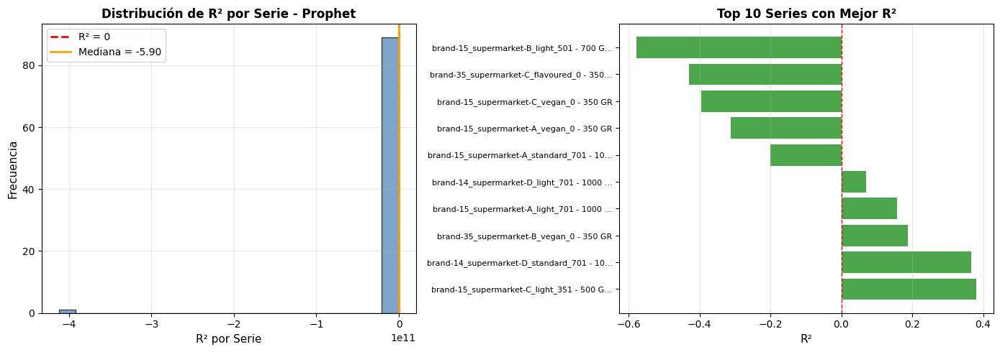


Top 10 series con MEJOR R²:
                                    series_id        r2  n_obs
    brand-15_supermarket-C_light_351 - 500 GR  0.381426      6
brand-14_supermarket-D_standard_701 - 1000 GR  0.367162      6
      brand-35_supermarket-B_vegan_0 - 350 GR  0.186992      6
   brand-15_supermarket-A_light_701 - 1000 GR  0.156431      6
   brand-14_supermarket-D_light_701 - 1000 GR  0.070557      6
brand-15_supermarket-A_standard_701 - 1000 GR -0.200997      6
      brand-15_supermarket-A_vegan_0 - 350 GR -0.310834      6
      brand-15_supermarket-C_vegan_0 - 350 GR -0.394662      6
  brand-35_supermarket-C_flavoured_0 - 350 GR -0.430237      6
    brand-15_supermarket-B_light_501 - 700 GR -0.578128      6

Top 10 series con PEOR R²:
                                    series_id            r2  n_obs
    brand-14_supermarket-D_light_351 - 500 GR -4.122883e+11      2
   brand-14_supermarket-D_standard_0 - 350 GR -3.664445e+08      5
    brand-14_supermarket-C_light_351 - 500 GR -2.

In [18]:
# 1. Distribución de R² por serie
if len(test_predictions_df) > 0 and len(r2_df) > 0:
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    
    # Histograma de R² por serie
    axes[0].hist(r2_df["r2"], bins=20, edgecolor="black", alpha=0.7, color="steelblue")
    axes[0].axvline(x=0, color="r", linestyle="--", linewidth=2, label="R² = 0")
    axes[0].axvline(x=r2_df["r2"].median(), color="orange", linestyle="-", linewidth=2, label=f"Mediana = {r2_df['r2'].median():.2f}")
    axes[0].set_xlabel("R² por Serie", fontsize=11)
    axes[0].set_ylabel("Frecuencia", fontsize=11)
    axes[0].set_title("Distribución de R² por Serie - Prophet", fontsize=12, fontweight="bold")
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)
    
    # Top 10 series con mejor R²
    top_r2 = r2_df.nlargest(10, "r2")
    axes[1].barh(range(len(top_r2)), top_r2["r2"].values, color="green", alpha=0.7)
    axes[1].set_yticks(range(len(top_r2)))
    axes[1].set_yticklabels([s[:40] + "..." if len(s) > 40 else s for s in top_r2["series_id"].values], fontsize=8)
    axes[1].set_xlabel("R²", fontsize=11)
    axes[1].set_title("Top 10 Series con Mejor R²", fontsize=12, fontweight="bold")
    axes[1].axvline(x=0, color="r", linestyle="--", linewidth=1)
    axes[1].grid(True, alpha=0.3, axis="x")
    
    plt.tight_layout()
    plt.show()
    
    # Mostrar tabla de mejores y peores series
    print("\nTop 10 series con MEJOR R²:")
    print(r2_df.nlargest(10, "r2")[["series_id", "r2", "n_obs"]].to_string(index=False))
    print("\nTop 10 series con PEOR R²:")
    print(r2_df.nsmallest(10, "r2")[["series_id", "r2", "n_obs"]].to_string(index=False))
else:
    print("⚠️ No hay datos para visualizar")


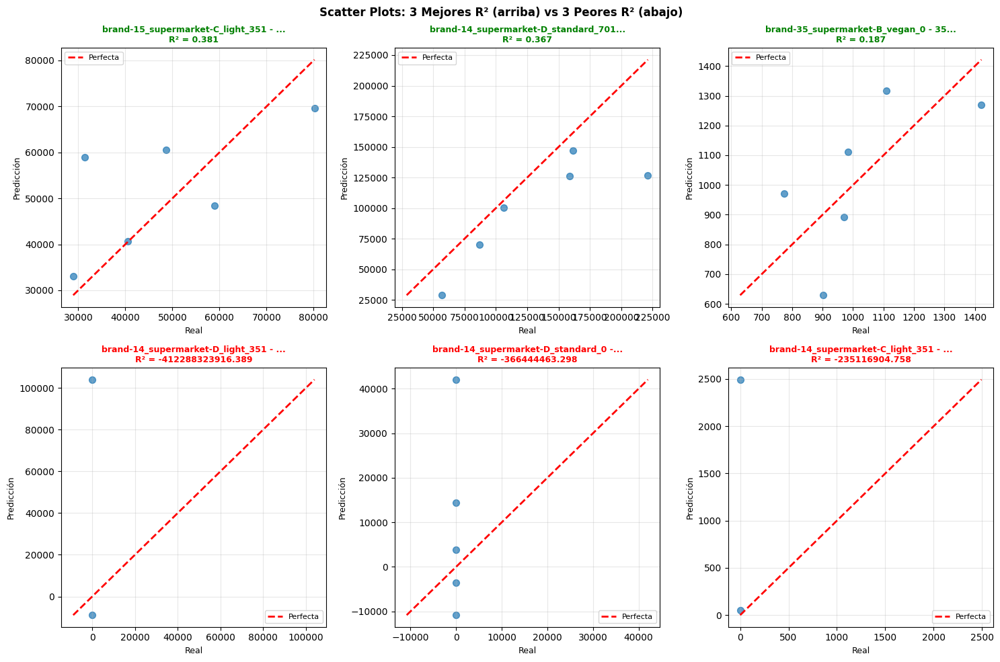

In [19]:
# 2. Scatter plots por serie (6 series representativas: 3 mejores y 3 peores R²)
if len(test_predictions_df) > 0 and len(r2_df) > 0:
    # Seleccionar 3 mejores y 3 peores
    best_series = r2_df.nlargest(3, "r2")["series_id"].values
    worst_series = r2_df.nsmallest(3, "r2")["series_id"].values
    selected_series = list(best_series) + list(worst_series)
    
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.flatten()
    
    for idx, series_id in enumerate(selected_series):
        series_data = results_df[results_df["series_id"] == series_id]
        r2_val = r2_df[r2_df["series_id"] == series_id]["r2"].values[0]
        
        y_true = series_data["volume.sales"].values
        y_pred = series_data["prediction"].values
        
        axes[idx].scatter(y_true, y_pred, alpha=0.7, s=50)
        # Línea perfecta
        min_val = min(y_true.min(), y_pred.min())
        max_val = max(y_true.max(), y_pred.max())
        axes[idx].plot([min_val, max_val], [min_val, max_val], 'r--', lw=2, label='Perfecta')
        
        # Título con R²
        title_color = "green" if r2_val > 0 else "red"
        axes[idx].set_title(f"{series_id[:35]}...\nR² = {r2_val:.3f}", fontsize=9, fontweight="bold", color=title_color)
        axes[idx].set_xlabel("Real", fontsize=9)
        axes[idx].set_ylabel("Predicción", fontsize=9)
        axes[idx].legend(fontsize=8)
        axes[idx].grid(True, alpha=0.3)
    
    plt.suptitle("Scatter Plots: 3 Mejores R² (arriba) vs 3 Peores R² (abajo)", fontsize=12, fontweight="bold")
    plt.tight_layout()
    plt.show()
else:
    print("⚠️ No hay datos para visualizar")


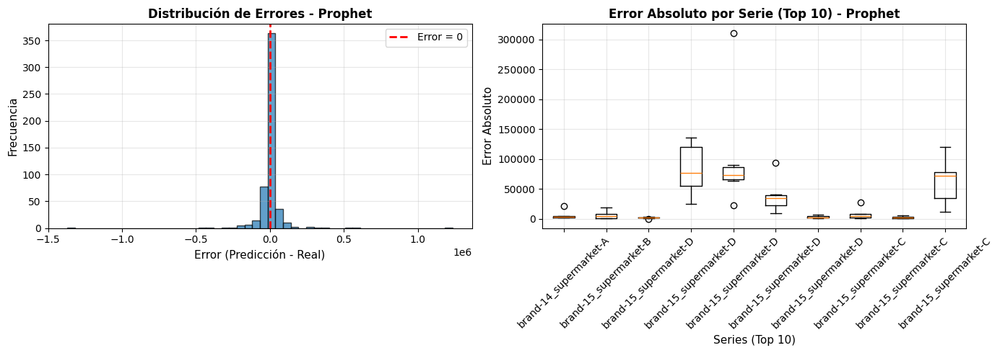

In [20]:
# 3. Distribución de errores
if len(test_predictions_df) > 0:
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    
    # Histograma de errores
    axes[0].hist(results_df["error"], bins=50, edgecolor="black", alpha=0.7)
    axes[0].axvline(x=0, color="r", linestyle="--", linewidth=2, label="Error = 0")
    axes[0].set_xlabel("Error (Predicción - Real)", fontsize=11)
    axes[0].set_ylabel("Frecuencia", fontsize=11)
    axes[0].set_title("Distribución de Errores - Prophet", fontsize=12, fontweight="bold")
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)
    
    # Box plot de errores absolutos por serie (top 10 series con más datos)
    top_series = results_df.groupby("series_id").size().sort_values(ascending=False).head(10).index
    top_series_data = results_df[results_df["series_id"].isin(top_series)]
    axes[1].boxplot([top_series_data[top_series_data["series_id"] == s]["abs_error"].values 
                     for s in top_series], 
                    labels=[s.split("_")[0] + "_" + s.split("_")[1] for s in top_series],
                    vert=True)
    axes[1].set_ylabel("Error Absoluto", fontsize=11)
    axes[1].set_xlabel("Series (Top 10)", fontsize=11)
    axes[1].set_title("Error Absoluto por Serie (Top 10) - Prophet", fontsize=12, fontweight="bold")
    axes[1].tick_params(axis="x", rotation=45)
    axes[1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
else:
    print("⚠️ No hay datos para visualizar")


In [21]:
# 4. Resumen de métricas por serie (incluyendo R²)
if len(test_predictions_df) > 0:
    metrics_by_series_agg = results_df.groupby("series_id").agg({
        "volume.sales": "sum",
        "prediction": "sum",
        "abs_error": "mean",
        "pct_error": "mean"
    }).reset_index()
    metrics_by_series_agg.columns = ["series_id", "total_real", "total_predicted", "mean_abs_error", "mean_pct_error"]
    metrics_by_series_agg["total_error"] = metrics_by_series_agg["total_predicted"] - metrics_by_series_agg["total_real"]
    
    # Agregar R² por serie
    metrics_by_series_agg = metrics_by_series_agg.merge(r2_df[["series_id", "r2"]], on="series_id", how="left")
    metrics_by_series_agg = metrics_by_series_agg.sort_values("mean_abs_error", ascending=False)
    
    print("=" * 80)
    print("RESUMEN DE MÉTRICAS POR SERIE - PROPHET")
    print("=" * 80)
    print(f"\nTop 10 series con mayor error absoluto medio:")
    print(metrics_by_series_agg.head(10)[["series_id", "mean_abs_error", "r2"]].to_string(index=False))
    print(f"\nTop 10 series con menor error absoluto medio:")
    print(metrics_by_series_agg.tail(10)[["series_id", "mean_abs_error", "r2"]].to_string(index=False))
    
    print(f"\n" + "=" * 80)
    print("ESTADÍSTICAS GENERALES")
    print("=" * 80)
    print(f"\nError Absoluto:")
    print(f"  Media: {metrics_by_series_agg['mean_abs_error'].mean():.2f}")
    print(f"  Mediana: {metrics_by_series_agg['mean_abs_error'].median():.2f}")
    print(f"  Desviación estándar: {metrics_by_series_agg['mean_abs_error'].std():.2f}")
    
    print(f"\nR² por Serie:")
    print(f"  Media: {r2_df['r2'].mean():.4f}")
    print(f"  Mediana: {r2_df['r2'].median():.4f}")
    print(f"  Desviación estándar: {r2_df['r2'].std():.4f}")
    print(f"  Series con R² > 0: {len(r2_df[r2_df['r2'] > 0])}/{len(r2_df)} ({100*len(r2_df[r2_df['r2'] > 0])/len(r2_df):.1f}%)")
    print(f"  Series con R² > 0.5: {len(r2_df[r2_df['r2'] > 0.5])}/{len(r2_df)} ({100*len(r2_df[r2_df['r2'] > 0.5])/len(r2_df):.1f}%)")
else:
    print("⚠️ No hay datos para visualizar")


RESUMEN DE MÉTRICAS POR SERIE - PROPHET

Top 10 series con mayor error absoluto medio:
                                    series_id  mean_abs_error            r2
    brand-15_supermarket-B_vegan_351 - 500 GR   318648.731741 -85918.485966
    brand-15_supermarket-A_light_501 - 700 GR   277526.410413  -5530.336319
    brand-14_supermarket-C_light_501 - 700 GR   204883.264782  -1841.805693
brand-15_supermarket-D_standard_701 - 1000 GR   162276.511060     -2.439320
 brand-35_supermarket-D_standard_351 - 500 GR   148891.265140    -14.496965
 brand-15_supermarket-D_standard_501 - 700 GR   139529.359599   -204.360125
 brand-14_supermarket-C_standard_501 - 700 GR   127483.503853   -313.663397
    brand-15_supermarket-D_light_501 - 700 GR   105894.948972   -268.025983
 brand-35_supermarket-A_standard_351 - 500 GR    88882.368953     -3.193528
 brand-14_supermarket-D_standard_351 - 500 GR    85556.716371           NaN

Top 10 series con menor error absoluto medio:
                              

In [22]:
# ============================================================================
# PASO 7: Predicciones Futuras con Escenarios de Precio
# ============================================================================

def generate_future_predictions_prophet(prophet_models_dict, last_data, regressor_cols, horizon=6, price_scenario='same'):
    """
    Genera predicciones futuras usando Prophet con diferentes escenarios de precio.
    
    Parameters:
    -----------
    prophet_models_dict : dict
        Diccionario con modelos Prophet entrenados (key: series_id)
    last_data : pd.DataFrame
        DataFrame con los últimos datos conocidos
    regressor_cols : list
        Lista de nombres de columnas de regresores
    horizon : int
        Número de meses a predecir
    price_scenario : str
        'same', 'plus3', 'minus3'
    
    Returns:
    --------
    DataFrame con predicciones futuras
    """
    future_predictions = []
    
    # Obtener el último mes conocido para cada serie
    last_by_series = last_data.groupby('series_id').tail(1).copy()
    
    for series_id in last_by_series['series_id'].unique():
        if series_id not in prophet_models_dict:
            continue
        
        series_last = last_by_series[last_by_series['series_id'] == series_id].iloc[0]
        model = prophet_models_dict[series_id]
        
        # Obtener historial de la serie (últimos datos conocidos)
        series_history = last_data[last_data['series_id'] == series_id].sort_values('date').copy()
        
        # Última fecha conocida
        last_date = pd.to_datetime(series_last['date'])
        
        # Precio base
        base_price = series_last['price']
        
        # Crear fechas futuras
        future_dates = pd.date_range(start=last_date + pd.DateOffset(months=1), periods=horizon, freq='MS')
        
        # Preparar DataFrame futuro
        future = pd.DataFrame({'ds': future_dates})
        
        # Proyectar regresores futuros
        for col in regressor_cols:
            if col == 'price' or 'price' in col.lower():
                # Para precio, aplicar escenario
                if price_scenario == 'plus3':
                    future[col] = base_price * 1.03
                elif price_scenario == 'minus3':
                    future[col] = base_price * 0.97
                else:
                    future[col] = base_price
            elif col in series_last.index:
                # Para otras variables, usar el último valor conocido (puede ser NaN para dummies)
                val = series_last[col]
                if pd.notna(val):
                    future[col] = val
                else:
                    # Si es NaN, usar 0 (típico para dummies que no están activas)
                    future[col] = 0
            elif col in series_history.columns:
                # Si no está en último valor, usar el promedio del historial
                future[col] = series_history[col].mean() if len(series_history) > 0 else 0
            else:
                # Si no está disponible, usar 0 (típico para dummies)
                future[col] = 0
        
        try:
            # Generar predicciones
            forecast = model.predict(future)
            
            # Guardar predicciones
            for idx, row in forecast.iterrows():
                future_predictions.append({
                    'series_id': series_id,
                    'date': row['ds'],
                    'prediction': row['yhat'],
                    'prediction_lower': row['yhat_lower'],
                    'prediction_upper': row['yhat_upper'],
                    'price_scenario': price_scenario
                })
        except Exception as e:
            print(f"⚠️ Error generando predicciones futuras para {series_id}: {str(e)}")
            continue
    
    return pd.DataFrame(future_predictions)

# Obtener datos hasta el final del test set para usar como base
data_for_forecast = pd.concat([train_data, test_data]).sort_values(['series_id', 'date'])

# Generar predicciones para los 3 escenarios
print("Generando predicciones futuras (6 meses)...")
print("Escenario: mismo precio")
forecast_same = generate_future_predictions_prophet(
    prophet_models, data_for_forecast, regressor_cols, horizon=6, price_scenario='same'
)

print("Escenario: precio +3%")
forecast_plus3 = generate_future_predictions_prophet(
    prophet_models, data_for_forecast, regressor_cols, horizon=6, price_scenario='plus3'
)

print("Escenario: precio -3%")
forecast_minus3 = generate_future_predictions_prophet(
    prophet_models, data_for_forecast, regressor_cols, horizon=6, price_scenario='minus3'
)

print(f"\nPredicciones generadas:")
print(f"  - Escenario mismo precio: {len(forecast_same)} predicciones")
print(f"  - Escenario +3%: {len(forecast_plus3)} predicciones")
print(f"  - Escenario -3%: {len(forecast_minus3)} predicciones")


Generando predicciones futuras (6 meses)...
Escenario: mismo precio
Escenario: precio +3%
Escenario: precio -3%

Predicciones generadas:
  - Escenario mismo precio: 576 predicciones
  - Escenario +3%: 576 predicciones
  - Escenario -3%: 576 predicciones


In [23]:
# ============================================================================
# PASO 8: Visualizaciones
# ============================================================================

# 1. Gráfico de predicciones vs valores reales (test set) - algunas series ejemplo
# n_series_to_plot = min(6, len(prophet_models))
n_series_to_plot = len(prophet_models)
example_series = list(prophet_models.keys())[:n_series_to_plot]

if len(test_predictions_df) > 0:
    fig, axes = plt.subplots(n_series_to_plot, 1, figsize=(15, 4 * n_series_to_plot))
    if n_series_to_plot == 1:
        axes = [axes]
    for idx, series_id in enumerate(example_series):
        series_test = test_data[test_data['series_id'] == series_id].sort_values('date')
        series_pred = test_predictions_df[test_predictions_df['series_id'] == series_id].sort_values('date')
        
        if len(series_test) == 0 or len(series_pred) == 0:
            continue
        
        axes[idx].plot(series_test['date'], series_test['volume.sales'], 'o-', 
                      label='Real', linewidth=2, markersize=6, color='blue')
        axes[idx].plot(series_pred['date'], series_pred['prediction'], 's-', 
                      label='Predicción', linewidth=2, markersize=6, color='red')
        axes[idx].fill_between(series_pred['date'], 
                               series_pred['prediction_lower'], 
                               series_pred['prediction_upper'],
                               alpha=0.3, color='red', label='Intervalo 95%')
        axes[idx].set_title(f'Test Set: {series_id}', fontsize=12, fontweight='bold')
        axes[idx].set_xlabel('Fecha')
        axes[idx].set_ylabel('Volume Sales')
        axes[idx].legend()
        axes[idx].grid(True, alpha=0.3)
    
    plt.tight_layout()


In [24]:
#FIXME: no hay variación en las diferencias de los escenarios

# 2. Gráfico de predicciones futuras con los 3 escenarios - algunas series ejemplo

fig, axes = plt.subplots(n_series_to_plot, 1, figsize=(15, 4 * n_series_to_plot))
if n_series_to_plot == 1:
    axes = [axes]

for idx, series_id in enumerate(example_series):
    # Datos históricos (últimos 6 meses del test)
    historical = test_data[test_data['series_id'] == series_id].sort_values('date').tail(6)
    
    # Predicciones futuras
    future_same = forecast_same[forecast_same['series_id'] == series_id].sort_values('date')
    future_plus3 = forecast_plus3[forecast_plus3['series_id'] == series_id].sort_values('date')
    future_minus3 = forecast_minus3[forecast_minus3['series_id'] == series_id].sort_values('date')
    
    if len(historical) == 0:
        continue
    
    axes[idx].plot(historical['date'], historical['volume.sales'], 'o-', 
                    label='Histórico (test)', linewidth=2, markersize=6, color='blue')
    
    if len(future_same) > 0:
        axes[idx].plot(future_same['date'], future_same['prediction'], 's--', 
                        label='Pred: mismo precio', linewidth=2, markersize=6, color='green')
    if len(future_plus3) > 0:
        axes[idx].plot(future_plus3['date'], future_plus3['prediction'], '^--', 
                        label='Pred: precio +3%', linewidth=2, markersize=6, color='orange')
    if len(future_minus3) > 0:
        axes[idx].plot(future_minus3['date'], future_minus3['prediction'], 'v--', 
                        label='Pred: precio -3%', linewidth=2, markersize=6, color='red')
    
    axes[idx].set_title(f'Predicciones Futuras (6 meses): {series_id}', fontsize=12, fontweight='bold')
    axes[idx].set_xlabel('Fecha')
    axes[idx].set_ylabel('Volume Sales')
    axes[idx].legend()
    axes[idx].grid(True, alpha=0.3)
    axes[idx].axvline(x=historical['date'].max(), color='gray', linestyle=':', 
                        linewidth=2, label='Inicio predicción')

plt.tight_layout()
plt.show()

# 3. Componentes del modelo Prophet (ejemplo para una serie)
if len(example_series) > 0:
    example_series_id = example_series[0]
    if example_series_id in prophet_models:
        print(f"\nComponentes del modelo Prophet para: {example_series_id}")
        fig = prophet_models[example_series_id].plot_components()
        plt.show()
else:
    print("No hay datos para visualizar")


Componentes del modelo Prophet para: brand-14_supermarket-A_flavoured_0 - 350 GR


TypeError: plot_components() missing 1 required positional argument: 'fcst'